In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px

In [2]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [3]:
import sqlite3

In [4]:
from textblob import TextBlob

In [5]:
from wordcloud import WordCloud,STOPWORDS

In [6]:
import re


In [7]:
import string


In [8]:
import nltk
from nltk.corpus import stopwords

# Reading Data

In [9]:
con = sqlite3.connect(r'C:\Users\rishi\Downloads\Projects\Amazon Customer Analysis\drive-download-20210301T164144Z-001\database.sqlite')

In [10]:
df = pd.read_sql_query('SELECT * FROM Reviews', con)

In [11]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [12]:
df.shape

(568454, 10)

In [13]:
pd.read_sql_query('SELECT * FROM Reviews LIMIT 3', con)

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


# Sentiment Analysis

In [14]:
text = df['Summary'][0]

In [15]:
TextBlob(text).sentiment.polarity

0.7

In [16]:
polarity = []
for i in df['Summary']:
    try:
        polarity.append(TextBlob(i).sentiment.polarity)
    except:
        polarity.append(0)

In [17]:
 data = df.copy()

In [18]:
data['polarity'] = polarity
len(polarity)

568454

# Explorative Data Analysis on Positive and Negative Comments

In [19]:
def positive_analysis(data):
    data_positive = data[data['polarity']>0]
    stopwords = set(STOPWORDS)    
    total_text = (' '.join(data_positive['Summary']))
    total_text_updated = re.sub('[^a-zA-Z]' ,' ', total_text)
    total_text_updated = re.sub(' +', ' ',total_text_updated)
    wordcloud = WordCloud(width = 1000 , height = 500 , stopwords = stopwords).generate(total_text_updated)
    plt.figure(figsize=(15,5))
    plt.imshow(wordcloud)
    plt.axis ('off')
    plt.title('Explorative Data Analysis on Positive Comments')

In [20]:
def negative_analysis(data):
    data_negative = data[data['polarity']<0]    
    stopwords = set(STOPWORDS)    
    total_text = (' '.join(data_negative['Summary']))
    total_text_updated = re.sub('[^a-zA-Z]' ,' ', total_text)
    total_text_updated = re.sub(' +', ' ',total_text_updated)
    wordcloud2 = WordCloud(width = 1000 , height = 500 , stopwords = stopwords).generate(total_text_updated)
    plt.figure(figsize=(15,5))
    plt.imshow(wordcloud2)
    plt.axis ('off')
    plt.title('Explorative Data Analysis on Negative Comments')

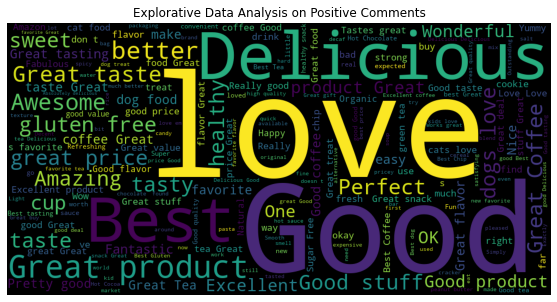

In [21]:
positive_analysis(data)

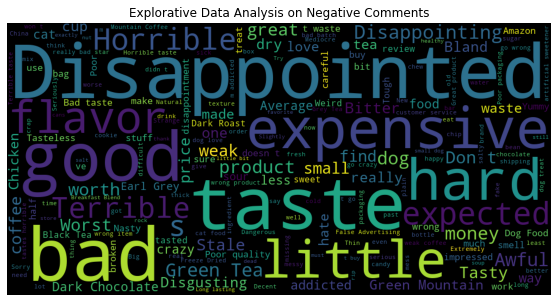

In [22]:
negative_analysis(data)

# Regular/Frequent User's of Amazon

In [23]:
df['UserId'].nunique()

256059

In [24]:
raw = df.groupby('UserId').agg({'Summary':'count','Text':'count', 'Score':'mean', 'ProductId':'count'}).sort_values(by = 'Text' , 
                                                                                                              ascending = False)

In [25]:
raw.columns = ['Number_of_summaries','No_of_text', 'Avg_Score' , 'No_of_products_purchased']

In [26]:
raw

,Number_of_summaries,No_of_text,Avg_Score,No_of_products_purchased
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256
...,...,...,...,...
A2HROKQO0GA5AF,1,1,3.000000,1
A2HROR28DMJV2W,1,1,5.000000,1
A2HRR8CO2Y20G8,1,1,5.000000,1


In [27]:
raw['User'] = raw.index
plt.figure(figsize=(20,8))
fig = px.bar(data_frame= raw[0:10] , x = 'User' , y = 'No_of_products_purchased' , labels={'No_of_products_purchased':'No of products purchased'} )

fig.show()

<Figure size 1440x576 with 0 Axes>

# Analyse the lengths of comments

In [28]:
final = df.copy() 

In [29]:
final.isnull().sum()

Id                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
Summary                   0
Text                      0
dtype: int64

In [30]:
final.duplicated().sum()

0

In [31]:
def calc_length(text):
    return len(text.split(' '))

In [32]:
final['Text_Length'] = final['Text'].apply(calc_length)

In [33]:
plt.figure(figsize=(20,8))
px.box(final , y = 'Text_Length' ,title = 'Length of Comments' )

<Figure size 1440x576 with 0 Axes>

Text(0.5, 1.0, 'Scores/Ratings given by the user')

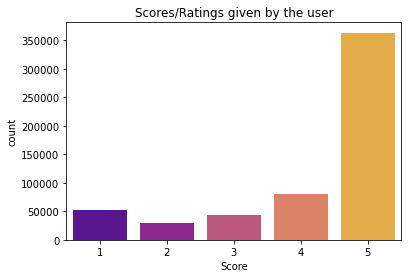

In [34]:
sns.countplot(final['Score'] , palette="plasma")
plt.title('Scores/Ratings given by the user')

# Customer behaviour

In [35]:
new_final=df[0:2000]

In [36]:
new_final['Text'] = new_final['Text'].str.lower()

<ipython-input-36-4c685bd608a2>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [37]:
def remove_punc(review):
    no_punc = ''
    for char in review:
        if char not in punctuations:
            no_punc = no_punc + char
    return no_punc

In [38]:
punctuations = string.punctuation

In [39]:
new_final['Text'] = new_final['Text'].apply(remove_punc)

<ipython-input-39-2ff50358cfef>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [40]:
def remove_stopwords(review):
    return ' '.join([word for word in review.split(' ') if word not in set(stopwords.words('english'))])

In [41]:
new_final['Text'] = new_final['Text'].apply(remove_stopwords)

<ipython-input-41-8d04daca1072>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [42]:
new_final['Text'].str.contains('http?').sum()

35

In [43]:
new_final['Text'].str.contains('http').sum()

35

In [44]:
def remove_urls(review):
    url_pattern = re.compile(r'href|http.\w+')
    return url_pattern.sub(r'', review)

In [45]:
new_final['Text'] = new_final['Text'].apply(remove_urls)


<ipython-input-45-57dcb3419359>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [46]:
for i in range(len(new_final['Text'])):
    new_final['Text'][i]=new_final['Text'][i].replace('br','')

<ipython-input-46-23e24e2662ae>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rishi\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3343: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [47]:
stopwords = set(STOPWORDS) 

In [48]:
data2=new_final.copy()
comment_words = '' 
for val in data2['Text']:
    # typecaste each val to string
    
    # split the value 
    tokens = val.split() 
    
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
    comment_words=comment_words+ " ".join(tokens)+" "
    

In [49]:
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

(-0.5, 799.5, 799.5, -0.5)

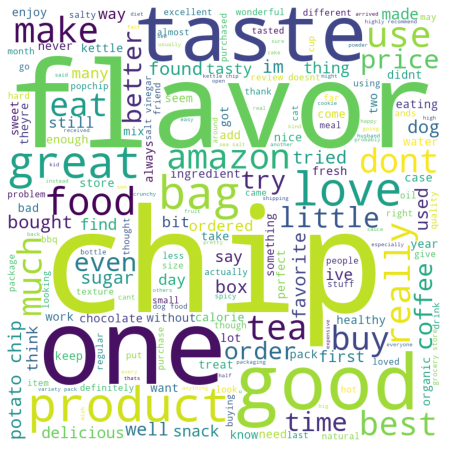

In [50]:
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud3) 
plt.axis("off") 